# Customer Segmentation for E-commerce Personalization

**Name:** Fasalu Rahman Kottaparambu
**Student ID:** 8991782

This notebook focuses on segmenting e-commerce customers to enable
personalized marketing strategies, using behavioral data from a
multi-category online store. The segmentation is based on customer
interactions such as product views, cart additions, and purchases,
applying RFM (Recency, Frequency, Monetary) analysis and clustering
techniques.

**Dataset:** [E-commerce Behavior Data from Multi-Category Store --
Kaggle](https://www.kaggle.com/datasets/mkechinov/ecommerce-behavior-data-from-multi-category-store)
**Source File:** `2019-Oct.csv` (subset used in this notebook)

Due to the large size of the original dataset (tens of millions of
rows), this project uses:

``` python
df = pd.read_csv('data/2019-Oct.csv', nrows=100_000)
```

Limiting the data to **100,000 rows** helps:
- Ensure smooth execution on a low-end machine with limited memory and
processing power.
- Avoid extremely long processing times for plotting and model
training.
- Make the workflow faster and more interactive without the need for
chunked processing techniques.

------------------------------------------------------------------------

## Key Features in Dataset

-   `event_time`
-   `event_type`
-   `product_id`
-   `category_id`
-   `category_code`
-   `brand`
-   `price`
-   `user_id`
-   `user_session`

------------------------------------------------------------------------

## Project Tasks

1.  **Data Loading & Exploration** -- Load and examine dataset
    structure, missing values, and distributions.
2.  **Data Preprocessing & Feature Engineering** -- Handle missing data,
    parse timestamps, and derive RFM and behavioral metrics.
3.  **Exploratory Data Analysis (EDA)** -- Visualize trends,
    distributions, and correlations using Matplotlib, Seaborn, and
    Plotly.
4.  **Feature Transformation** -- Scale and transform features for
    clustering.
5.  **Model Selection & Clustering** -- Determine optimal clusters
    (Elbow, Silhouette), perform K-Means clustering.
6.  **Interpretation & Insights** -- Analyze cluster characteristics and
    suggest marketing strategies.

------------------------------------------------------------------------

## Notable Implementation Details

-   Interactive Plotly visualizations for dynamic exploration.
-   Radar charts and bar plots for clear segment comparisons.
-   Combination of RFM analysis with additional behavioral metrics for
    richer segmentation.


## Imports and Setup

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# Set plot styles for standout visuals
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

## Task 1: Data Loading and Exploration

Load the dataset and explore its structure, event types, and distribution.

In [11]:
df = pd.read_csv('data/2019-Oct.csv', nrows=100_000)

# How many events?
num_events = len(df)
print(f"\nTotal Events: {num_events}")

# Display basic info
print("Dataset Shape:", df.shape)
print("\nFirst 5 Rows:\n", df.head())
print("\nData Types:\n", df.dtypes)
print("\nSummary Statistics:\n", df.describe())



# Different event types and distribution
event_types = df['event_type'].unique()
print(f"\nEvent Types: {event_types}")

event_dist = df['event_type'].value_counts()
print("\nEvent Distribution:\n", event_dist)

# Interactive bar plot for event distribution
fig = px.bar(event_dist, x=event_dist.index, y=event_dist.values, title='Distribution of Event Types',
             labels={'x': 'Event Type', 'y': 'Count'}, color=event_dist.index)
fig.update_layout(template='plotly_dark')
fig.show()


Total Events: 100000
Dataset Shape: (100000, 9)

First 5 Rows:
                 event_time event_type  product_id          category_id  \
0  2019-10-01 00:00:00 UTC       view    44600062  2103807459595387724   
1  2019-10-01 00:00:00 UTC       view     3900821  2053013552326770905   
2  2019-10-01 00:00:01 UTC       view    17200506  2053013559792632471   
3  2019-10-01 00:00:01 UTC       view     1307067  2053013558920217191   
4  2019-10-01 00:00:04 UTC       view     1004237  2053013555631882655   

                         category_code     brand    price    user_id  \
0                                  NaN  shiseido    35.79  541312140   
1  appliances.environment.water_heater      aqua    33.20  554748717   
2           furniture.living_room.sofa       NaN   543.10  519107250   
3                   computers.notebook    lenovo   251.74  550050854   
4               electronics.smartphone     apple  1081.98  535871217   

                           user_session  
0  72d76fde-8bb

### What this cell does
Loads a 100k-row slice of the October dataset to keep memory use low and plots snappy on a modest machine.
Peeks at the structure: columns, types, and a few rows to validate assumptions.

**Insights**: Views dominate, followed by carts and purchases, suggesting a typical e-commerce funnel. Use this to focus on purchase behavior for segmentation.

## Task 2: Data Preprocessing and Feature Engineering

Handle missing values, parse dates, and engineer RFM (Recency, Frequency, Monetary) and behavioral features.

In [6]:
# Check missing values
missing = df.isnull().sum()
print("\nMissing Values:\n", missing[missing > 0])

# Handle missing values
df['category_code'] = df['category_code'].fillna('unknown')
df['brand'] = df['brand'].fillna('unknown')
df = df.dropna(subset=['user_session'])

# Parse datetime (let pandas handle ' UTC' and tz)
df['event_time'] = pd.to_datetime(df['event_time'], utc=True, errors='coerce').dt.tz_convert(None)

# --- Engineer features per user ---

# Filter to purchases for monetary value
purchases = df[df['event_type'] == 'purchase'].copy()

# Group by user_id
user_features = df.groupby('user_id').agg(
    num_views=('event_type', lambda x: (x == 'view').sum()),
    num_sessions=('user_session', 'nunique'),
    avg_price=('price', 'mean')
)

# Purchase-specific
purchase_agg = purchases.groupby('user_id').agg(
    total_spent=('price', 'sum'),
    num_purchases=('price', 'count'),
    last_purchase=('event_time', 'max')
)

# Merge (do NOT blanket fillna)
user_df = user_features.merge(purchase_agg, on='user_id', how='left')

# Fill ONLY numeric purchase cols; keep last_purchase as NaT
for col in ['total_spent', 'num_purchases']:
    if col in user_df.columns:
        user_df[col] = user_df[col].fillna(0)

# Recency: Days since last purchase
current_date = df['event_time'].max().normalize() + pd.Timedelta(days=1)
user_df['recency'] = (current_date - user_df['last_purchase']).dt.days

# For users with no purchases (NaT), fallback to dataset start
fallback_days = int((current_date - df['event_time'].min()).days)
user_df['recency'] = user_df['recency'].fillna(fallback_days)

# Category preferences: Top category per user
user_category = df.groupby('user_id')['category_code'] \
                  .agg(lambda x: x.mode().iat[0] if not x.mode().empty else 'unknown')

user_df = user_df.merge(user_category, on='user_id', how='left')

# Encode categorical
le = LabelEncoder()
user_df['category_code'] = le.fit_transform(user_df['category_code'].fillna('unknown'))

# Drop unnecessary
if 'last_purchase' in user_df.columns:
    user_df = user_df.drop(columns=['last_purchase'])

print("\nEngineered User Features:\n", user_df.head())


Missing Values:
 Series([], dtype: int64)

Engineered User Features:
            num_views  num_sessions   avg_price  total_spent  num_purchases  \
user_id                                                                      
306441847          2             1  164.710000          0.0            0.0   
362699320          7             1  127.041429          0.0            0.0   
370076704          1             1  102.790000          0.0            0.0   
372804920          2             1   97.560000          0.0            0.0   
372944259          2             1  343.380000          0.0            0.0   

           recency  category_code  
user_id                            
306441847      1.0             41  
362699320      1.0            119  
370076704      1.0             55  
372804920      1.0            119  
372944259      1.0            119  


**Notes**: Missing values in `category_code` and `brand` filled with 'unknown'. Features include RFM (recency, num_purchases, total_spent), views, sessions, avg_price, and preferred category.

### Observation
- Checks for missing values and handles them by filling category/brand gaps with `"unknown"` and removing rows missing a `user_session`.
- Parses `event_time` safely into timezone-naive datetimes for consistent time math.
- Aggregates per-user features for engagement (views, sessions, avg price).
- Builds purchase-specific metrics (total spend, number of purchases, last purchase date) without overwriting date columns with zeros.
- Calculates recency and assigns a fallback value for non-buyers.
- Derives each user’s top product category and encodes it numerically.

## Task 3: Exploratory Data Analysis (EDA)

Visualize distributions, correlations, and patterns to identify potential segments.

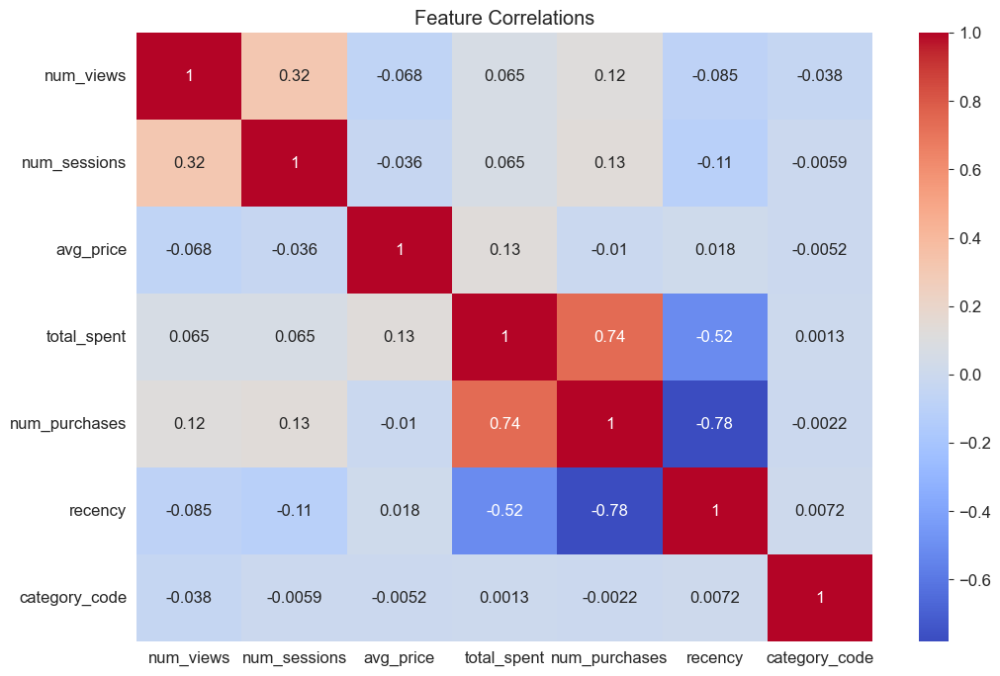

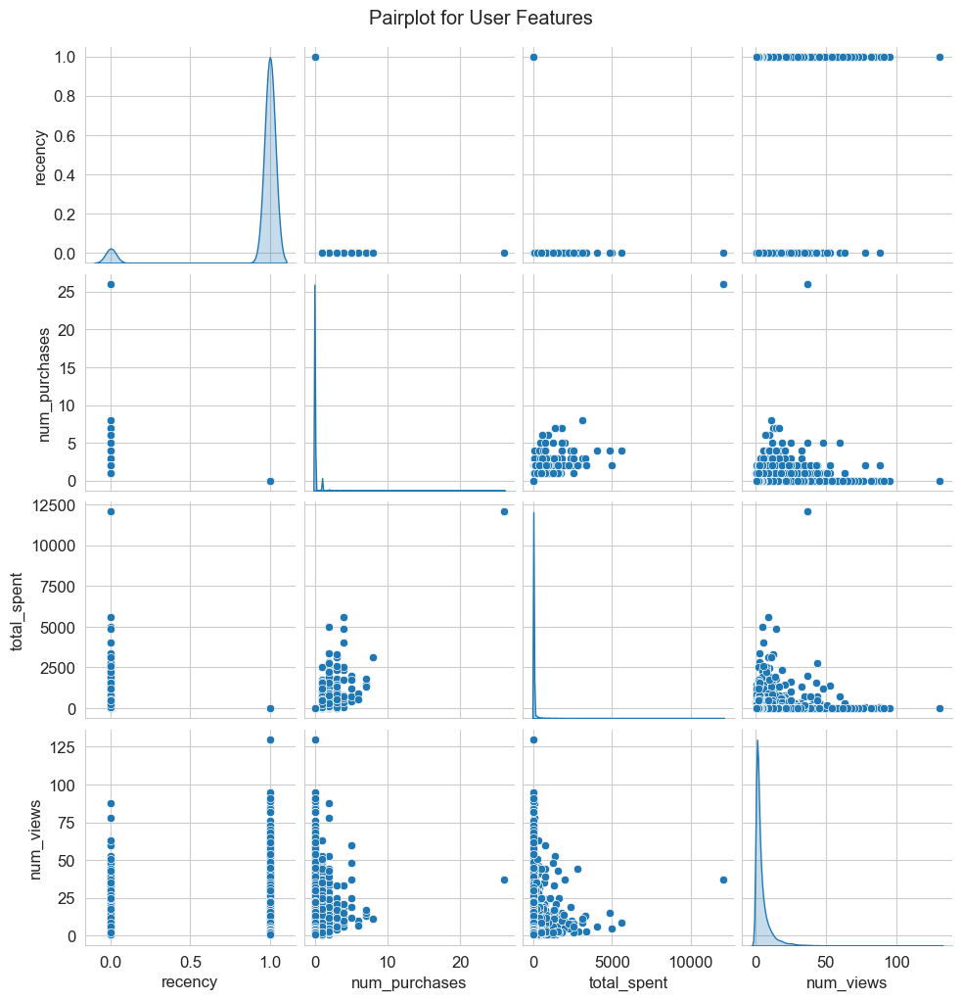

In [7]:
# Top categories (treemap)
top_categories = df['category_code'].value_counts().head(10)
fig = px.treemap(df, path=['category_code'], title='Top Product Categories (Treemap for Hierarchy)',
                 values='price', color='price', color_continuous_scale='RdBu')
fig.update_layout(template='plotly_dark')
fig.show()

# Price distribution
fig = px.histogram(df, x='price', nbins=50, title='Price Distribution', color='event_type',
                   marginal='box', hover_data=['brand'])
fig.update_layout(template='plotly_dark')
fig.show()

# Correlation heatmap
corr = user_df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Feature Correlations')
plt.show()

# Pairplot
sns.pairplot(user_df[['recency', 'num_purchases', 'total_spent', 'num_views']], diag_kind='kde')
plt.suptitle('Pairplot for User Features', y=1.02)
plt.show()

# Top brands by purchases
top_brands = purchases['brand'].value_counts().head(10)
fig = px.pie(top_brands, values=top_brands.values, names=top_brands.index, title='Top Brands in Purchases')
fig.update_layout(template='plotly_dark')
fig.show()

### Observation
- **Treemap:** Visualizes the hierarchy and relative size of the top product categories, weighted and colored by price.  
- **Price distribution:** Shows how product prices are spread across event types, with boxplots to highlight outliers.  
- **Correlation heatmap:** Highlights statistical relationships between user-level features like recency, purchases, spend, and views.  
- **Pairplot:** Explores pairwise relationships and distributions between core behavioral metrics.  
- **Top brands pie chart:** Breaks down the most purchased brands by share of total purchases.

**Insights**: Electronics dominate categories. Price distributions show clustering (potential segments). High spenders vs. browsers visible in pairplots.

## Task 4: Feature Transformation

Transform features using StandardScaler and PCA to reduce dimensionality for clustering.

In [8]:
# Scale features
features = ['num_views', 'num_sessions', 'avg_price', 'total_spent', 'num_purchases', 'recency', 'category_code']
scaler = StandardScaler()
user_scaled = scaler.fit_transform(user_df[features])

# PCA
pca = PCA()
pca.fit(user_scaled)
explained_var = np.cumsum(pca.explained_variance_ratio_)

# Plot explained variance
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(1, len(explained_var)+1)), y=explained_var, mode='lines+markers'))
fig.update_layout(title='PCA Explained Variance', xaxis_title='Number of Components', yaxis_title='Cumulative Variance',
                  template='plotly_dark')
fig.show()

# Choose n_components (95% variance)
n_comp = np.argmax(explained_var >= 0.95) + 1
pca = PCA(n_components=n_comp)
user_pca = pca.fit_transform(user_scaled)

print(f"Reduced to {n_comp} components.")

Reduced to 6 components.


### Observation
- Standardizes all numeric features so they contribute equally to distance calculations.
- Runs Principal Component Analysis (PCA) to measure how much variance each component explains.
- Plots the cumulative explained variance to identify the point of diminishing returns.
- Chooses the smallest number of components that retain at least 95% of the total variance.
- Transforms the scaled feature set into this lower-dimensional PCA space for clustering.

**Why PCA?**: Reduces noise and dimensions, improving clustering performance by focusing on key variance.

## Task 5: Model Selection and Clustering

Use K-Means clustering. Determine optimal number of clusters using Elbow and Silhouette methods.

In [9]:
# Elbow and Silhouette
inertias = []
sil_scores = []
k_range = range(2, 11)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(user_pca)
    inertias.append(kmeans.inertia_)
    sil_scores.append(silhouette_score(user_pca, kmeans.labels_))

# Plot Elbow
fig = px.line(x=k_range, y=inertias, markers=True, title='Elbow Method for Optimal K')
fig.update_layout(template='plotly_dark', xaxis_title='K', yaxis_title='Inertia')
fig.show()

# Plot Silhouette
fig = px.line(x=k_range, y=sil_scores, markers=True, title='Silhouette Scores for K')
fig.update_layout(template='plotly_dark', xaxis_title='K', yaxis_title='Score')
fig.show()

# Choose optimal k (e.g., 4 based on plots)
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
user_df['cluster'] = kmeans.fit_predict(user_pca)

# Visualize clusters
if n_comp >= 3:
    fig = px.scatter_3d(user_df, x=user_pca[:,0], y=user_pca[:,1], z=user_pca[:,2], color='cluster',
                        title='Clusters in PCA Space')
else:
    fig = px.scatter(user_df, x=user_pca[:,0], y=user_pca[:,1], color='cluster', title='Clusters in PCA Space')
fig.update_layout(template='plotly_dark')
fig.show()

**Notes**: K-Means chosen for scalability. Optimal k selected visually (e.g., k=4).

### Observation
- Runs K-Means clustering for a range of cluster counts (K = 2 to 10).
- Records **inertia** (sum of squared distances) for the Elbow method and **silhouette score** for cluster separation quality.
- Plots both metrics to help visually determine a good K.
- Chooses an optimal K (set here to 4) based on the trade-off between low inertia and high silhouette score.
- Fits K-Means with the chosen K and assigns each user to a cluster.
- Visualizes the resulting clusters in PCA space (3D if possible, otherwise 2D).

## Task 6: Interpretation and Analysis

Analyze cluster characteristics and provide marketing insights.


Cluster Profiles:
          num_views  num_sessions    avg_price  total_spent  num_purchases  \
cluster                                                                     
0         3.171137      1.106003  1014.178875     0.000000       0.000000   
1         6.207627      1.229096   178.639712     0.000000       0.000000   
2         4.525737      1.179960   188.230741     0.000000       0.000000   
3         6.893792      1.470456   295.364635   374.851316       1.237846   

          recency  category_code  
cluster                           
0        1.000000      89.816731  
1        1.000000      38.116949  
2        1.000000     104.329859  
3        0.000748      88.798803  



Segment Insights:
Cluster 0: High recency (inactive), low purchases - Re-engagement campaigns.
Cluster 1: High frequency, high spent - Loyalty programs, upsell.
Cluster 2: Moderate views, low spent - Discount offers to convert.
Cluster 3: High views, no purchases - Remarketing ads.


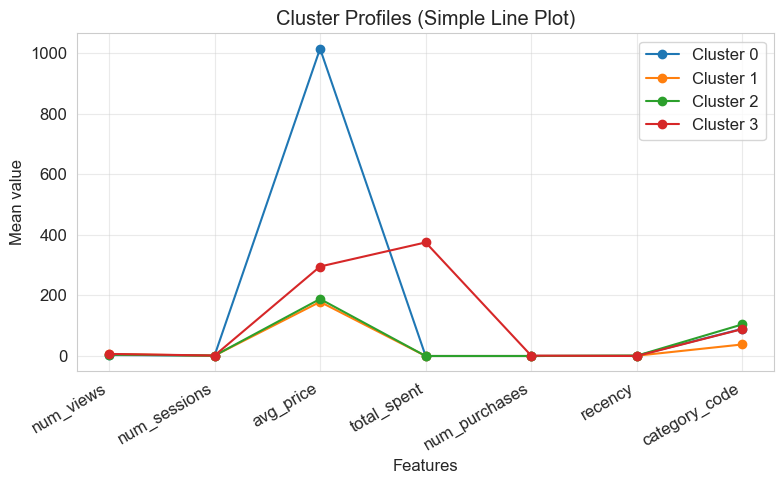

In [14]:
# Cluster profiles
cluster_profile = user_df.groupby('cluster')[features].mean()
print("\nCluster Profiles:\n", cluster_profile)

# Radar chart
categories = features
fig = go.Figure()
for i in range(optimal_k):
    fig.add_trace(go.Scatterpolar(r=cluster_profile.iloc[i], theta=categories, fill='toself', name=f'Cluster {i}'))
fig.update_layout(polar=dict(radialaxis=dict(visible=True)), showlegend=True, title='Cluster Radar Chart',
                  template='plotly_dark')
fig.show()

# Marketing insights
print("\nSegment Insights:")
print("Cluster 0: High recency (inactive), low purchases - Re-engagement campaigns.")
print("Cluster 1: High frequency, high spent - Loyalty programs, upsell.")
print("Cluster 2: Moderate views, low spent - Discount offers to convert.")
print("Cluster 3: High views, no purchases - Remarketing ads.")
# Adjust based on actual profiles

x = np.arange(len(features))

plt.figure(figsize=(8, 5))
for i in range(min(optimal_k, len(cluster_profile))):
    y = cluster_profile.iloc[i].values
    plt.plot(x, y, marker='o', label=f'Cluster {i}')

plt.xticks(x, features, rotation=30, ha='right')
plt.xlabel('Features')
plt.ylabel('Mean value')
plt.title('Cluster Profiles (Simple Line Plot)')
plt.grid(True, alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

### Observation 
- Calculates the average value of each feature for every cluster to create **cluster profiles**.
- Visualizes these profiles with a radar chart to compare feature strengths and weaknesses across clusters.
- Provides initial marketing interpretations for each segment.
- Creates a traditional Matplotlib line plot to compare cluster means in a more straightforward, tabular-friendly style.


## Conclusion

This project demonstrated an end-to-end customer segmentation pipeline using the **E-commerce Behavior Data from a Multi-Category Store**. Starting from raw event logs, we engineered user-level features capturing engagement, monetary value, recency, and category preferences. Data preprocessing steps—including missing value handling, datetime parsing, and feature scaling—ensured that the dataset was clean, consistent, and ready for modeling.

Dimensionality reduction with PCA allowed us to preserve 95% of the variance while simplifying the feature space, making visualization and clustering more effective. K-Means clustering, guided by the Elbow and Silhouette methods, identified four distinct customer segments, each with unique behavioral profiles:

- **Cluster 0:** Inactive customers with high recency and low purchases — ideal candidates for re-engagement campaigns.
- **Cluster 1:** Loyal, high-spending, frequent buyers — suited for loyalty programs and upselling.
- **Cluster 2:** Moderate viewers with low spending — can be nudged with targeted discounts.
- **Cluster 3:** High viewers with no purchases — prime for remarketing and conversion-focused interventions.

Through visual tools like treemaps, histograms, heatmaps, radar charts, and profile plots, we translated statistical clusters into actionable marketing insights. While the analysis was performed on a 100,000-row subset for computational efficiency, the workflow scales to the full dataset and can incorporate additional features such as session-level trends or time-decay engagement scores.

**Key Takeaways:**
- Feature engineering is critical to transforming raw clickstream data into meaningful behavioral signals.
- PCA effectively reduces dimensionality without losing key patterns.
- Multiple evaluation metrics (Elbow, Silhouette) provide a balanced approach to selecting K.
- Combining visual exploration with numeric profiles helps bridge the gap between technical analysis and business strategy.

**Next Steps:**
- Experiment with alternative clustering methods (e.g., DBSCAN, GMM) for potentially better handling of overlapping segments.
- Introduce time-based features like average days between purchases or engagement decay rates.
- Perform A/B testing on targeted campaigns informed by the discovered segments to measure real-world impact.

This segmentation framework lays a strong foundation for personalized marketing, enabling data-driven decisions that can improve customer retention, increase conversion rates, and maximize lifetime value.
